# 构建STdataset

In [1]:
import netCDF4 as nc
import h5py
import xarray as xr

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

import torch
from torch.utils.data import Dataset, IterableDataset
import torch.nn.functional as F

import os
from pathlib import Path
import re
from datetime import datetime


def plot_ocean_data(data, i):
    """
    绘制第i个时刻的海洋数据

    参数:
    - data: 海洋数据的三维数组，形状为(112, 120, 280)
    - i: 要绘制的时刻的索引（从0开始）
    
    返回:
    - 绘制的数据图像。
    """
    time_data = data[i, :, :]
    
    plt.figure(figsize=(10, 6))
    
    plt.imshow(time_data, cmap='viridis', origin='lower', aspect='auto')
    plt.colorbar(label='Data Value')

    plt.xlabel('Longitude Index')
    plt.ylabel('Latitude Index')
    plt.title(f'Ocean Data at Time Index {i}')

    plt.show()



def plot_multiple_ocean_data(data, indices):
    """
    绘制多个时刻的海洋数据子图。

    参数:
    - data: 海洋数据的三维数组，形状为(112, 120, 280)
    - indices: 要绘制的时刻索引列表（从0开始）

    返回:
    - 绘制的多个子图。
    """
    num_plots = len(indices)
    cols = min(num_plots, 3)  # 每行最多绘制3个子图
    rows = (num_plots + cols - 1) // cols  # 计算总行数

    fig, axes = plt.subplots(rows, cols, figsize=(5 * cols, 4 * rows), constrained_layout=True)
    axes = axes.flatten()  # 将子图数组展平，方便索引

    for idx, time_idx in enumerate(indices):
        time_data = data[time_idx, :, :]
        ax = axes[idx]
        im = ax.imshow(time_data, cmap='viridis', origin='lower', aspect='auto')
        ax.set_title(f'Time Index {time_idx}')
        ax.set_xlabel('Longitude Index')
        ax.set_ylabel('Latitude Index')
        plt.colorbar(im, ax=ax, shrink=0.8)

    # 如果子图数量小于网格中的子图数量，隐藏多余的子图
    for idx in range(num_plots, len(axes)):
        axes[idx].axis('off')

    plt.show()



def down_sample(ds, lat_num=360, lon_num=720):
    '''
    数据降采样到360*720
    ds: xarray.Dataset (lat: 720, lon: 1440, time: 313)

    return: 降采样后的数据 (lat: 720, lon: 360, time: 313)

    '''
    # 降采样
    original_lat = ds['lat']
    original_lon = ds['lon']
    new_lat = np.linspace(original_lat.min(), original_lat.max(), lat_num)
    new_lon = np.linspace(original_lon.min(), original_lon.max(), lon_num)

    ds_resampled = ds.interp(lat=new_lat, lon=new_lon)


    return ds_resampled

def interp2refer(ds, refer_path):
    """
    将ds插值到参考数据
    ds: xarray.Dataset (lat, lon, time)
    refer_path: 参考数据地址

    return: 插值后的数据 (lat: 720, lon: 360, time: 313)
    """
    refer_ds = xr.open_dataset(refer_path)
    new_lat = xr.DataArray(refer_ds.lat, dims="lat", coords={"lat": refer_ds.lat})
    new_lon = xr.DataArray(refer_ds.lon, dims="lon", coords={"lon": refer_ds.lon})

    # # 执行双线性插值
    ds_interp = ds.interp(lat=new_lat, lon=new_lon, method="linear")

    return ds_interp


def compute_anom(data):
    """
    计算每个变量的气候学平均值, 从而计算其异常值
    data: data (xarray.Dataset or xarray.DataArray): 包含多个变量的时间序列数据，维度为 (time, lat, lon)

    return: xarray.Dataset or xarray.DataArray: 包含异常值的数据集，维度为 (time, lat, lon)

    """
    
    # 计算气候学平均值（沿着time维度求平均）
    clim_mean = data.mean(dim='time')
    clim_mean_expanded = clim_mean.broadcast_like(data)
    anomalies = data - clim_mean_expanded
    
    return anomalies

sst_path = '/home/data2/pengguohang/My_Ocean/challenge/1993_2019_data/raw/oisst_199301_201901_monthly.nc'

# SST


1. 时间长：平均为每日数据；
2. 统一经纬度时间坐标，删去其他
3. 空间降采样至统一的坐标
4. 计算平均值，减去气候态

In [2]:
# demo case
file_path1 = '/home/data2/pengguohang/My_Ocean/NOAA/SST/data/199301/oisst-avhrr-v02r01.19930130.nc'
file_path2 = '/home/data2/pengguohang/My_Ocean/NOAA/SST/data/199312/oisst-avhrr-v02r01.19931230.nc'
# 数据文件夹路径
folder_path = '/home/data2/pengguohang/My_Ocean/NOAA/SST/data/'
# 输出地址
output_file = '/home/data2/pengguohang/My_Ocean/challenge/1993_2019_data/raw/oisst_199301_201901_monthly.nc'

dict_keys(['anom', 'err', 'ice', 'lat', 'lon', 'sst', 'time', 'zlev'])
anom (1, 1, 720, 1440)
err (1, 1, 720, 1440)
ice (1, 1, 720, 1440)
lat (720,)
lon (1440,)
sst (1, 1, 720, 1440)
time (1,)
zlev (1,)
<class 'netCDF4.Variable'>
int16 sst(time, zlev, lat, lon)
    long_name: Daily sea surface temperature
    units: Celsius
    _FillValue: -999
    add_offset: 0.0
    scale_factor: 0.01
    valid_min: -300
    valid_max: 4500
unlimited dimensions: time
current shape = (1, 1, 720, 1440)
filling on


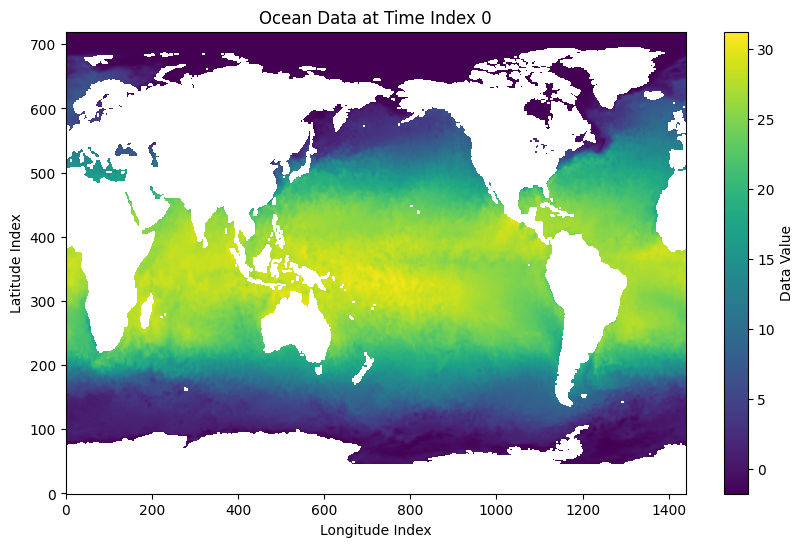

In [3]:
# 查看sst数据基本信息，均为每日数据，需处理为每月数据
with nc.Dataset(file_path1, 'r') as f:
    print(f.variables.keys())
    for key in f.variables.keys():
        print(key, f[key][:].shape)
    sst = f['sst'][:]
    print(f['sst'])

plot_ocean_data(sst[0], 0)

In [4]:
# 数据处理：从每日数据计算每月数据，得到我的数组

def get_month_data(folder_path):
    """
    从每日数据计算每月数据

    参数:
    - folder_path: 该月数据的地址，文件夹中包含该月的每日数据
    
    返回:
    - 该月的平均数据
    """
    files = sorted([f for f in os.listdir(folder_path) if f.endswith('.nc')])  # 找到该月的所有 nc 文件

    data_list = []  # 存储该月所有的每日数据
    for file in files:
        file_path = os.path.join(folder_path, file)
        ds = xr.open_dataset(file_path)  # (time: 1, zlev: 1, lat: 720, lon: 1440)
        data_list.append(ds)

    if len(data_list) <20:
        print(f'none data path: {folder_path}')
        return None
    
    combined_data = xr.concat(data_list, dim='time')  # 按时间维度合并 (time: 31, zlev: 1, lat: 720, lon: 1440)

    monthly_mean_sst = combined_data['sst'].mean(dim='time')  # 按时间维度计算平均值(zlev: 1, lat: 720, lon: 1440)
    # monthly_mean_anom = combined_data['anom'].mean(dim='time')
    # monthly_mean_err = combined_data['err'].mean(dim='time')

    monthly_data = xr.Dataset(
        {
            'sst': monthly_mean_sst,
            # 'anom': monthly_mean_anom,
            # 'err': monthly_mean_err,
        },
        coords={
            'lat': combined_data['lat'],
            'lon': combined_data['lon']
        }
    )
    
    return monthly_data


# 读取每月数据的地址
month_path = []
for file_name in os.listdir(folder_path):
    if file_name.isdigit() and 199301 <= int(file_name) <= 201901:
        month_path.append(file_name)
month_path = sorted(month_path)  # 排序
print(len(month_path))  # 313个月份
print(month_path)

# 循环计算每个月份数据，并将所有月份数据保存在一起
all_monthly_data = []  # 存储所有月份的月度数据
print(f'number of month is: {len(month_path)}')
i = 0
for month in month_path:
    path = os.path.join(folder_path, month)  # 每个月份的地址
    monthly_data = get_month_data(path)
    if monthly_data is not None: 
        all_monthly_data.append(monthly_data)
    else:
        print(f'{month} is none')

    if i % 30 == 0:
        print(f'已处理{i}个月份')
    i+=1


313
['199301', '199302', '199303', '199304', '199305', '199306', '199307', '199308', '199309', '199310', '199311', '199312', '199401', '199402', '199403', '199404', '199405', '199406', '199407', '199408', '199409', '199410', '199411', '199412', '199501', '199502', '199503', '199504', '199505', '199506', '199507', '199508', '199509', '199510', '199511', '199512', '199601', '199602', '199603', '199604', '199605', '199606', '199607', '199608', '199609', '199610', '199611', '199612', '199701', '199702', '199703', '199704', '199705', '199706', '199707', '199708', '199709', '199710', '199711', '199712', '199801', '199802', '199803', '199804', '199805', '199806', '199807', '199808', '199809', '199810', '199811', '199812', '199901', '199902', '199903', '199904', '199905', '199906', '199907', '199908', '199909', '199910', '199911', '199912', '200001', '200002', '200003', '200004', '200005', '200006', '200007', '200008', '200009', '200010', '200011', '200012', '200101', '200102', '200103', '2001

<xarray.Dataset>
Dimensions:  (lat: 720, lon: 1440, time: 313)
Coordinates:
  * lat      (lat) float32 -89.88 -89.62 -89.38 -89.12 ... 89.38 89.62 89.88
  * lon      (lon) float32 0.125 0.375 0.625 0.875 ... -0.625 -0.375 -0.125
  * time     (time) datetime64[ns] 1993-01-01 1993-02-01 ... 2019-01-01
Data variables:
    data     (time, lat, lon) float32 nan nan nan nan ... -1.46 -1.8 -1.8 -1.8
(313, 720, 1440)


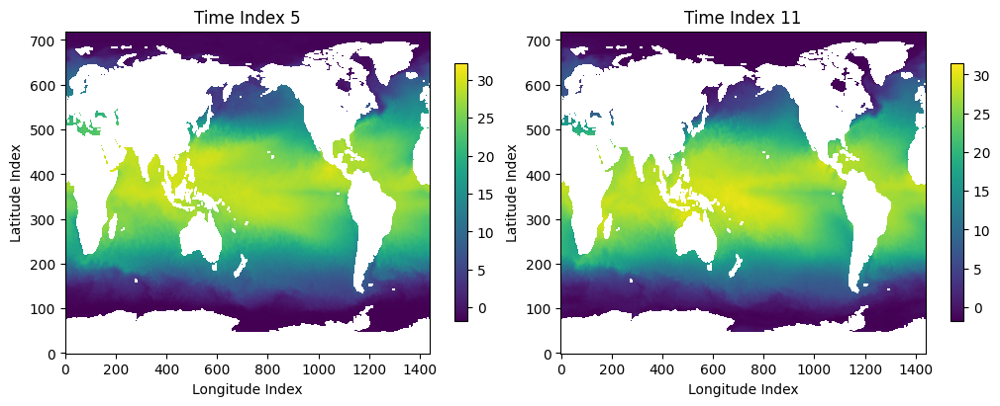

In [5]:
# 合并所有月度数据
combined_monthly_data = xr.concat(all_monthly_data, dim='time')
# 删去zlev维度
combined_monthly_data = combined_monthly_data.drop('zlev')
combined_monthly_data = combined_monthly_data.squeeze(dim='zlev')
# 将经度从0到360转换为-180到180
combined_monthly_data = combined_monthly_data.assign_coords(lon=((combined_monthly_data.lon - 180) % 360) - 180)
# 创建时间坐标
time_coords = pd.date_range(start='1993-01-01', end='2019-01-01', freq='MS')
combined_monthly_data = combined_monthly_data.assign_coords(time=time_coords)
# 变量重命名为data
combined_monthly_data = combined_monthly_data.rename({'sst': 'data'})

print(combined_monthly_data)



print(combined_monthly_data['data'].values.shape)
plot_multiple_ocean_data(combined_monthly_data['data'].values, [5, 11])

<xarray.Dataset>
Dimensions:  (time: 313, lat: 360, lon: 720)
Coordinates:
  * time     (time) datetime64[ns] 1993-01-01 1993-02-01 ... 2019-01-01
  * lat      (lat) float64 -89.88 -89.37 -88.87 -88.37 ... 88.87 89.37 89.88
  * lon      (lon) float64 -179.9 -179.4 -178.9 -178.4 ... 178.9 179.4 179.9
Data variables:
    data     (time, lat, lon) float64 nan nan nan nan ... 0.0122 -0.1805 -0.1808


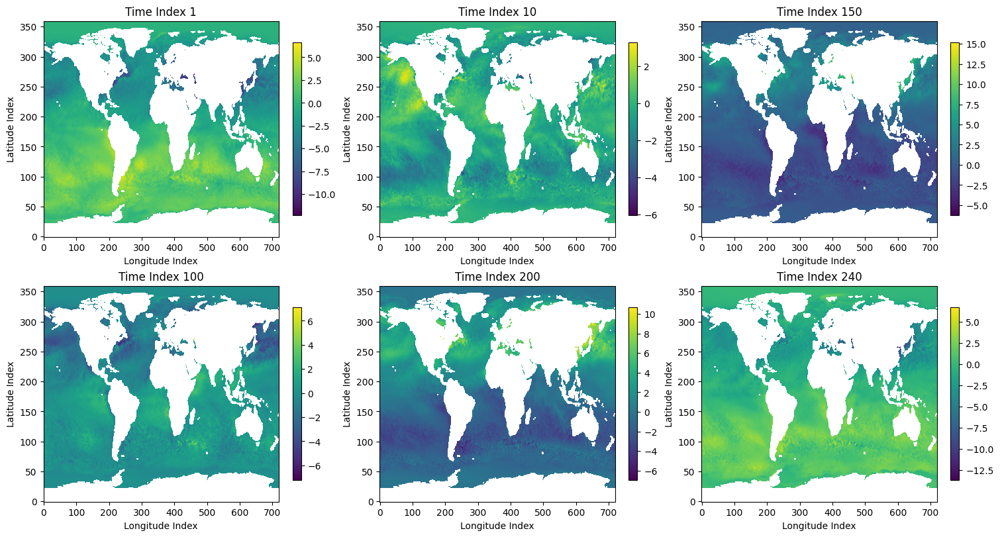

数据已成功保存至 /home/data2/pengguohang/My_Ocean/challenge/1993_2019_data/raw/oisst_199301_201901_monthly.nc


In [6]:
# 降采样
ds_resampled = down_sample(combined_monthly_data)
# 减去气候态
ds_anom = compute_anom(ds_resampled)
print(ds_anom)

plot_multiple_ocean_data(ds_anom['data'].values, [1, 10, 150, 100, 200, 240])

# 保存合并后的所有月份数据为 NetCDF 文件
ds_anom.to_netcdf(output_file)
print(f"数据已成功保存至 {output_file}")

# SLA

time: 313, latitude: 719, longitude: 1439

In [7]:
file_path = '/home/data2/pengguohang/My_Ocean/CMEMS/sla_1993_2019/sla_1993_2019.nc'

output_file = '/home/data2/pengguohang/My_Ocean/challenge/1993_2019_data/raw/sla_199301_201901_monthly.nc'

<xarray.Dataset>
Dimensions:    (time: 313, latitude: 720, longitude: 1440)
Coordinates:
  * latitude   (latitude) float32 -89.88 -89.62 -89.38 ... 89.38 89.62 89.88
  * longitude  (longitude) float32 -179.9 -179.6 -179.4 ... 179.4 179.6 179.9
  * time       (time) datetime64[ns] 1993-01-01 1993-02-01 ... 2019-01-01
Data variables:
    sla        (time, latitude, longitude) float64 ...
Attributes: (12/43)
    Conventions:                     CF-1.6
    Metadata_Conventions:            Unidata Dataset Discovery v1.0
    cdm_data_type:                   Grid
    comment:                         Monthly Mean of Sea Level Anomalies refe...
    contact:                         servicedesk.cmems@mercator-ocean.eu
    creator_email:                   servicedesk.cmems@mercator-ocean.eu
    ...                              ...
    time_coverage_duration:          P1M
    time_coverage_end:               1993-01-31T00:00:00Z
    time_coverage_resolution:        P1M
    time_coverage_start:     

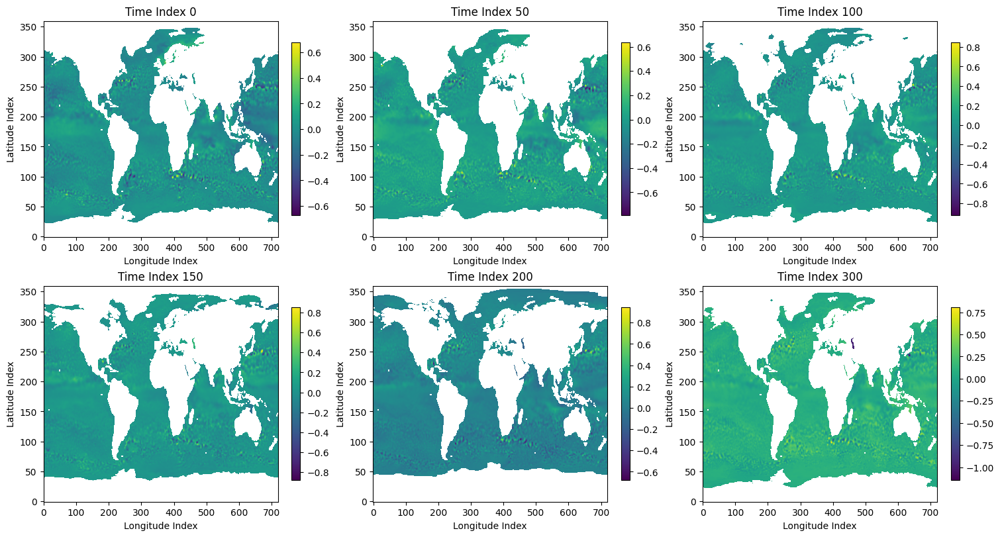

In [8]:
ds = xr.open_dataset(file_path)
print(ds)
# 统一变量命名
ds = ds.rename({'longitude': 'lon', 'latitude': 'lat'})
ds = ds.rename({'sla': 'data'})
# 下采样
ds_resampled = down_sample(ds)

ds_resampled.to_netcdf(output_file)

print(ds_resampled)
plot_multiple_ocean_data(ds_resampled['data'].values, [0, 50, 100, 150, 200, 300])

# MDT



In [9]:
file_path = '/home/data2/pengguohang/My_Ocean/AVISO+/mdt_cnes_cls18_global.nc'
refer_path = '/home/data2/pengguohang/My_Ocean/challenge/1993_2019_data/raw/oisst_199301_201901_monthly.nc'
output_file = '/home/data2/pengguohang/My_Ocean/challenge/1993_2019_data/raw/mdt_cnes_cls18_global_down.nc'


<xarray.Dataset>
Dimensions:    (time: 1, latitude: 1440, longitude: 2880)
Coordinates:
  * time       (time) datetime64[ns] 1950-01-01
  * latitude   (latitude) float32 -89.94 -89.81 -89.69 ... 89.69 89.81 89.94
  * longitude  (longitude) float32 0.0625 0.1875 0.3125 ... 359.7 359.8 359.9
Data variables:
    mdt        (time, latitude, longitude) float64 ...
Attributes: (12/25)
    cdm_data_type:              Grid
    Conventions:                CF-1.6
    Metadata_Conventions:       Unidata Dataset Discovery v1.0
    contact:                    aviso@altimetry.fr, smulet@groupcls.com
    creator_email:              smulet@groupcls.com
    creator_url:                https://www.aviso.altimetry.fr
    ...                         ...
    keywords_vocabulary:        NetCDF COARDS Climate and Forecast Standard N...
    processing_level:           L4
    product_version:            1.0
    summary:                    Mean Dynamic Topography calculated from the c...
    title:             

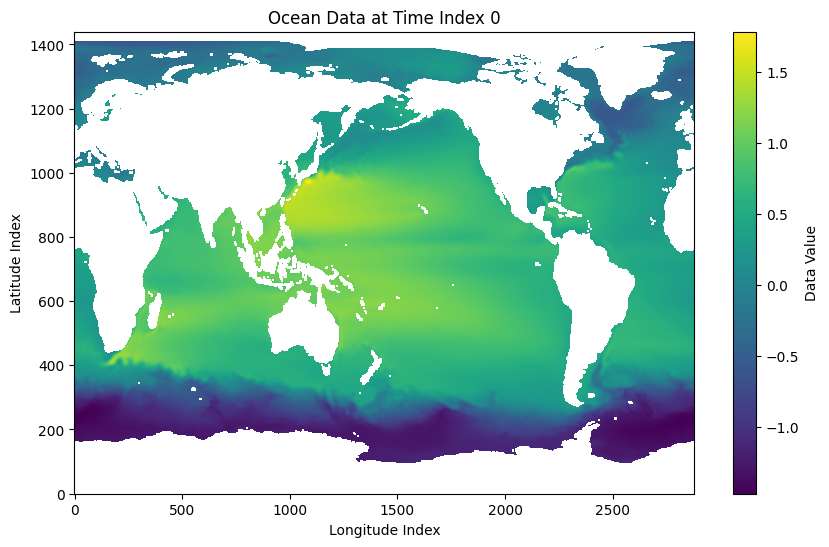

In [10]:
ds = xr.open_dataset(file_path)
# 删去所有其他变量
ds = ds.drop_vars(['u', 'v', 'err_mdt', 'err_u', 'err_v', 'lat_bnds', 'lon_bnds', 'crs'])
# 删去nv维度
ds = ds.drop('nv')

print(ds)
plot_ocean_data(ds['mdt'].values, 0)

In [11]:
# 经纬度重命名
ds_rename = ds.rename({
    'longitude': 'lon',
    'mdt': 'data',
    'latitude': 'lat'
})
# 将经度从0到360转换为-180到180
ds_lon = ds_rename.assign_coords(lon=((ds_rename.lon - 180) % 360) - 180)

# 创建一个新的时间坐标，包含313个相同的时间点
new_time = xr.DataArray(np.repeat(ds_lon.time.values, 313), dims='time')
# 使用 xarray.concat 按照新的时间坐标重复 ds
repeated_ds = xr.concat([ds_lon for _ in range(313)], dim=new_time)

# 对齐时间维度
new_times = pd.date_range(start='1993-01-01', end='2019-01-01', freq='MS')  # 新的时间序列：每个月的第一天
new_times = new_times.to_numpy()

# 更换time维度
ds_interp = repeated_ds.drop('time')
repeated_ds = repeated_ds.assign_coords(time=new_times)
repeated_ds = repeated_ds.transpose('time', 'lat', 'lon')

print(repeated_ds)

<xarray.Dataset>
Dimensions:  (time: 313, lat: 1440, lon: 2880)
Coordinates:
  * time     (time) datetime64[ns] 1993-01-01 1993-02-01 ... 2019-01-01
  * lat      (lat) float32 -89.94 -89.81 -89.69 -89.56 ... 89.69 89.81 89.94
  * lon      (lon) float32 0.0625 0.1875 0.3125 ... -0.3125 -0.1875 -0.0625
Data variables:
    data     (time, lat, lon) float64 nan nan nan nan nan ... nan nan nan nan
Attributes: (12/25)
    cdm_data_type:              Grid
    Conventions:                CF-1.6
    Metadata_Conventions:       Unidata Dataset Discovery v1.0
    contact:                    aviso@altimetry.fr, smulet@groupcls.com
    creator_email:              smulet@groupcls.com
    creator_url:                https://www.aviso.altimetry.fr
    ...                         ...
    keywords_vocabulary:        NetCDF COARDS Climate and Forecast Standard N...
    processing_level:           L4
    product_version:            1.0
    summary:                    Mean Dynamic Topography calculated fro

<xarray.Dataset>
Dimensions:  (time: 313, lat: 360, lon: 720)
Coordinates:
  * time     (time) datetime64[ns] 1993-01-01 1993-02-01 ... 2019-01-01
  * lat      (lat) float64 -89.88 -89.37 -88.87 -88.37 ... 88.87 89.37 89.88
  * lon      (lon) float64 -179.9 -179.4 -178.9 -178.4 ... 178.9 179.4 179.9
Data variables:
    data     (time, lat, lon) float64 nan nan nan nan nan ... nan nan nan nan
Attributes: (12/25)
    cdm_data_type:              Grid
    Conventions:                CF-1.6
    Metadata_Conventions:       Unidata Dataset Discovery v1.0
    contact:                    aviso@altimetry.fr, smulet@groupcls.com
    creator_email:              smulet@groupcls.com
    creator_url:                https://www.aviso.altimetry.fr
    ...                         ...
    keywords_vocabulary:        NetCDF COARDS Climate and Forecast Standard N...
    processing_level:           L4
    product_version:            1.0
    summary:                    Mean Dynamic Topography calculated from

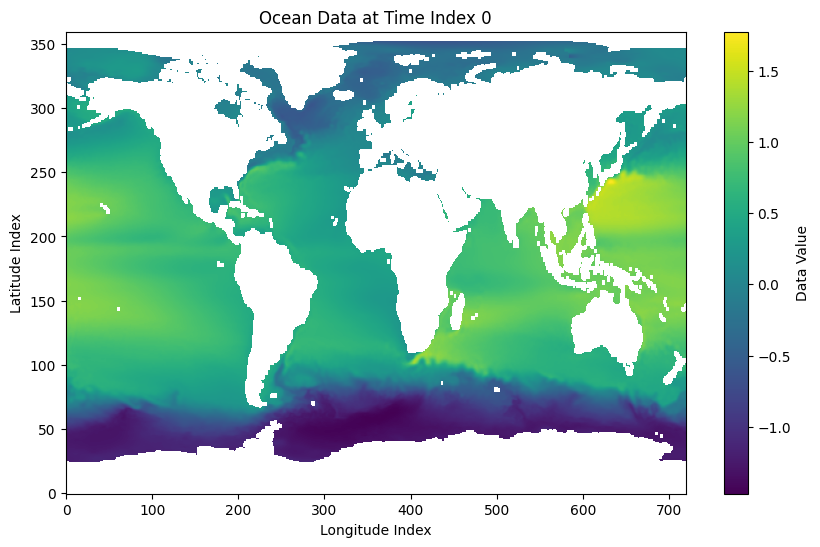

In [12]:
ds_resampled = down_sample(repeated_ds)
ds_resampled = interp2refer(ds_resampled, sst_path)
print(ds_resampled)

ds_resampled.to_netcdf(output_file)

plot_ocean_data(ds_resampled['data'].values, 0)

# UV

In [13]:
folder_path = '/home/data2/pengguohang/My_Ocean/CCMP/ccmp_1993_201904_M'
file = file = os.path.join(folder_path, 'CCMP_Wind_Analysis_200201_V02.0_L3.5_RSS.nc')

output_file_u = '/home/data2/pengguohang/My_Ocean/challenge/1993_2019_data/raw/u_199301_201901_monthly.nc'
output_file_v = '/home/data2/pengguohang/My_Ocean/challenge/1993_2019_data/raw/v_199301_201901_monthly.nc'

<xarray.Dataset>
Dimensions:    (longitude: 1440, latitude: 628, time: 1)
Coordinates:
  * longitude  (longitude) float32 0.125 0.375 0.625 0.875 ... 359.4 359.6 359.9
  * latitude   (latitude) float32 -78.38 -78.12 -77.88 ... 77.88 78.12 78.38
  * time       (time) datetime64[ns] 2002-01-15
Data variables:
    uwnd       (time, latitude, longitude) float32 ...
    vwnd       (time, latitude, longitude) float32 ...
Attributes: (12/36)
    contact:                    Remote Sensing Systems, support@remss.com
    Conventions:                CF-1.6
    data_structure:             grid
    title:                      RSS CCMP V2.0 monthly average derived surface...
    history:                    20160713T175743ZZ - netCDF generated from ori...
    description:                RSS monthly average of VAM 6-hour analyses st...
    ...                         ...
    contributor_name:           Joel Scott, Frank Wentz, Ross Hoffman, Mark L...
    contributor_role:           Software Engineer, 

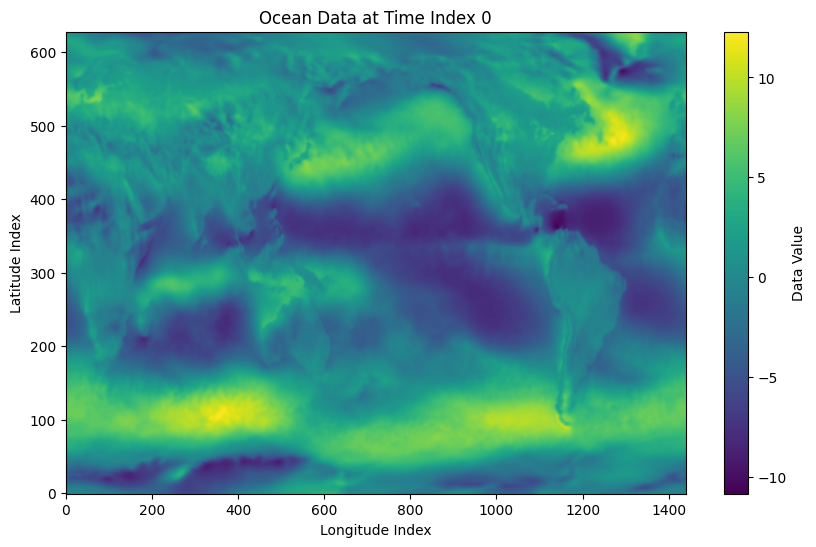

In [14]:
ds = xr.open_dataset(file)
print(ds)
plot_ocean_data(ds['uwnd'], 0)

In [15]:
# 合并每月数据,差了200201 - 已补充
files = sorted([f for f in os.listdir(folder_path) if f.endswith('.nc')])
print(len(files))
all_month_u = []
all_month_v = []
for file in files:
    file_path = os.path.join(folder_path, file)
    data = xr.open_dataset(file_path)
    u = data['uwnd']
    v = data['vwnd']

    all_month_u.append(u)
    all_month_v.append(v)
print('month: ', len(all_month_u), len(all_month_v))

u_data = xr.concat(all_month_u, 'time')
v_data = xr.concat(all_month_v, 'time')

# 合并在一个dataset中
ds = xr.Dataset({
    'uwnd': u_data,
    'vwnd': v_data
})

# 重命名坐标轴名称
ds_renamed = ds.rename({'longitude': 'lon', 'latitude': 'lat'})
# 对齐时间维度
new_times = pd.date_range(start='1993-01-01', end='2019-01-01', freq='MS')  # 新的时间序列：每个月的第一天
new_times = new_times.to_numpy()
# 更换time维度
ds_renamed = ds_renamed.drop('time')
ds_renamed = ds_renamed.assign_coords(time=new_times)
ds_renamed = ds_renamed.transpose('time', 'lat', 'lon')

# lon坐标转为-180 180
ds_lon = ds_renamed.assign_coords(lon=((ds_renamed.lon - 180) % 360) - 180)
ds_lon = ds_lon.roll(lon=len(ds_lon.lon) // 2, roll_coords=True)

print(ds_lon)


# print(u_data)

313


month:  313 313
<xarray.Dataset>
Dimensions:  (lon: 1440, lat: 628, time: 313)
Coordinates:
  * lon      (lon) float32 -179.9 -179.6 -179.4 -179.1 ... 179.4 179.6 179.9
  * lat      (lat) float32 -78.38 -78.12 -77.88 -77.62 ... 77.88 78.12 78.38
  * time     (time) datetime64[ns] 1993-01-01 1993-02-01 ... 2019-01-01
Data variables:
    uwnd     (time, lat, lon) float32 1.282 1.282 1.282 ... -1.347 -1.362 -1.376
    vwnd     (time, lat, lon) float32 0.5232 0.5386 0.5539 ... 1.24 1.259 1.277


<xarray.Dataset>
Dimensions:  (time: 313, lat: 360, lon: 720)
Coordinates:
  * time     (time) datetime64[ns] 1993-01-01 1993-02-01 ... 2019-01-01
  * lat      (lat) float64 -89.88 -89.37 -88.87 -88.37 ... 88.87 89.37 89.88
  * lon      (lon) float64 -179.9 -179.4 -178.9 -178.4 ... 178.9 179.4 179.9
Data variables:
    uwnd     (time, lat, lon) float64 nan nan nan nan nan ... nan nan nan nan
    vwnd     (time, lat, lon) float64 nan nan nan nan nan ... nan nan nan nan


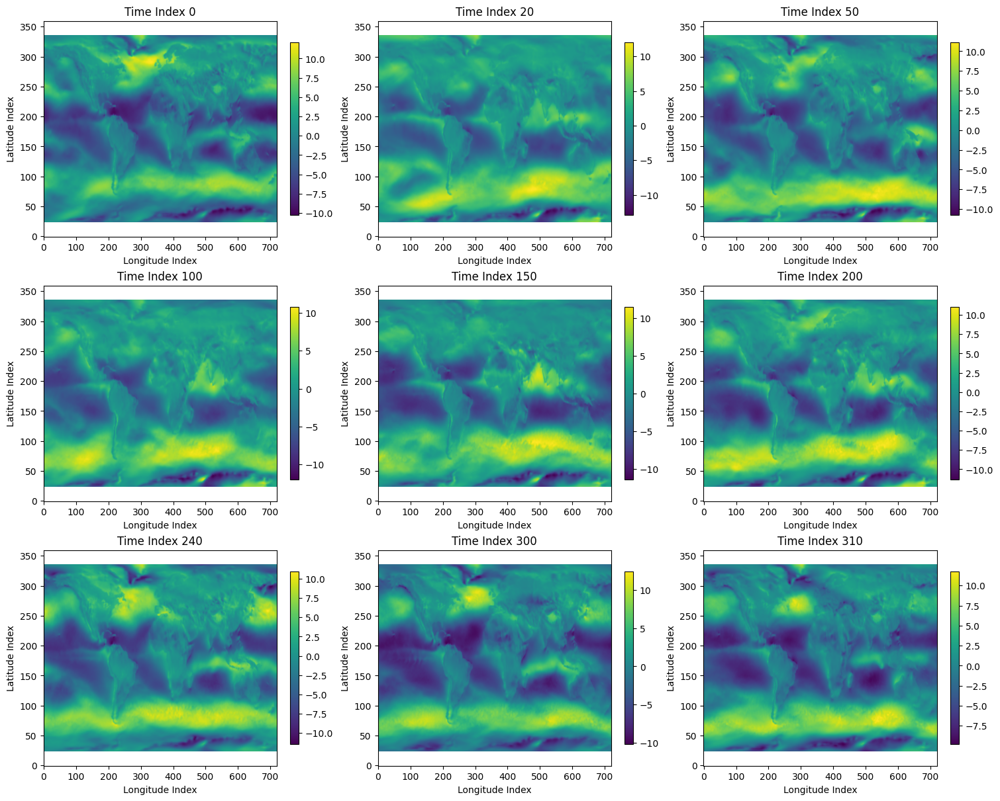

In [16]:
# 在lat的两边填充维度：
original_lat = ds_lon.lat.values

new_lat_lower = np.linspace(-90, original_lat.min(), num=47)
new_lat_upper = np.linspace(original_lat.max(), 90, num=47)
new_lat = np.concatenate([new_lat_lower[:-1], original_lat, new_lat_upper[1:]])

ds_expanded = ds_lon.reindex(lat=new_lat, method=None)  # 新增纬度点会被填充为NaN

# 降采样
ds_resampled = down_sample(ds_expanded, 360, 720)
# 插值到sst上
ds_interp = interp2refer(ds_resampled, sst_path)
print(ds_interp)
plot_multiple_ocean_data(ds_interp['uwnd'].values, [0, 20, 50, 100, 150, 200, 240, 300, 310])

<xarray.Dataset>
Dimensions:  (time: 313, lat: 360, lon: 720)
Coordinates:
  * time     (time) datetime64[ns] 1993-01-01 1993-02-01 ... 2019-01-01
  * lat      (lat) float64 -89.88 -89.37 -88.87 -88.37 ... 88.87 89.37 89.88
  * lon      (lon) float64 -179.9 -179.4 -178.9 -178.4 ... 178.9 179.4 179.9
Data variables:
    uwnd     (time, lat, lon) float64 nan nan nan nan nan ... nan nan nan nan
    vwnd     (time, lat, lon) float64 nan nan nan nan nan ... nan nan nan nan


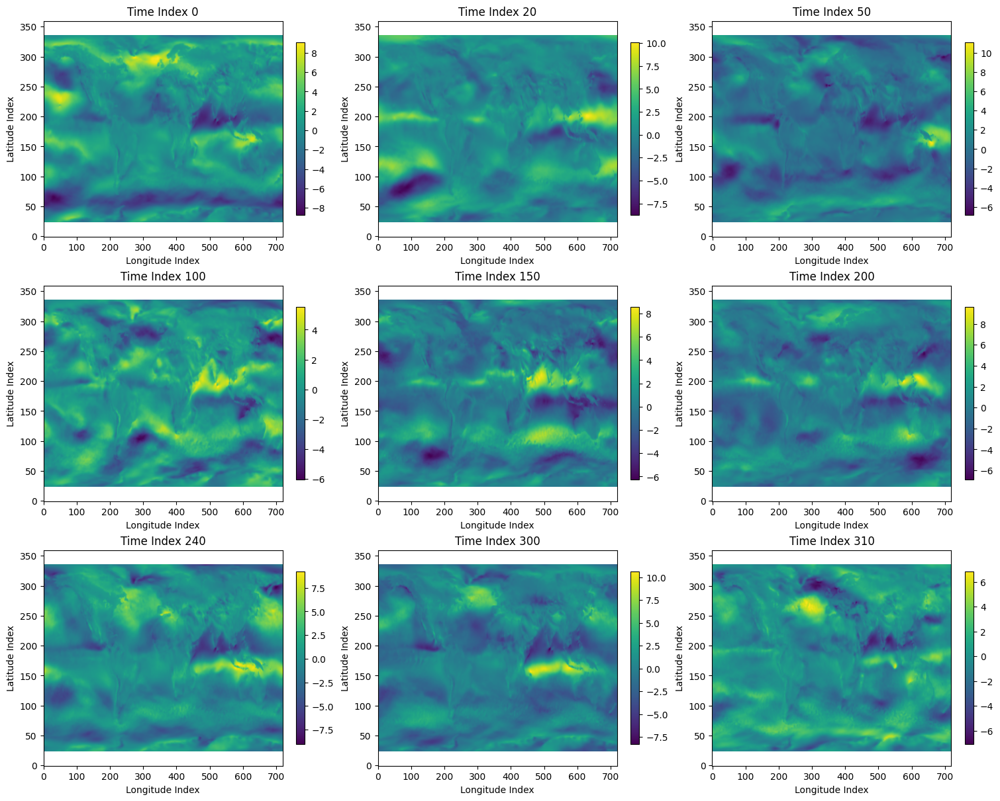

In [17]:
# 计算气候态
ds_anom = compute_anom(ds_interp)
print(ds_anom)
plot_multiple_ocean_data(ds_anom['uwnd'].values, [0, 20, 50, 100, 150, 200, 240, 300, 310])

# 保存
uwnd = ds_anom['uwnd']
uwnd = uwnd.rename('data')
uwnd.to_netcdf(output_file_u)

vwnd = ds_anom['vwnd']
vwnd = vwnd.rename('data')
vwnd.to_netcdf(output_file_v)

# SSS

In [18]:
path = '/home/data2/pengguohang/My_Ocean/CMEMS/sss_199301_201901_monthly/cmems_obs-mob_glo_phy-sss_my_multi_P1M_sos_179.94W-179.94E_89.94S-89.94N_0.00m_1993-01-01-2019-01-01.nc'

output_file = '/home/data2/pengguohang/My_Ocean/challenge/1993_2019_data/raw/sss_l4_199301_201901_monthly_down.nc'

<xarray.Dataset>
Dimensions:    (time: 313, depth: 1, latitude: 1440, longitude: 2880)
Coordinates:
  * depth      (depth) float32 0.0
  * latitude   (latitude) float32 -89.94 -89.81 -89.69 ... 89.69 89.81 89.94
  * longitude  (longitude) float32 -179.9 -179.8 -179.7 ... 179.7 179.8 179.9
  * time       (time) datetime64[ns] 1993-01-01 1993-02-01 ... 2019-01-01
Data variables:
    sos        (time, depth, latitude, longitude) float32 ...
Attributes: (12/20)
    Conventions:               CF-1.7
    Scaling_Equation:          (scale_factor*data) + add_offset
    contact:                   servicedesk.cmems@mercator-ocean.eu
    creation_date:             Sat 12 Aug 2023 11:07:53
    date:                      Sat 07 Oct 2023 12:34:08 /store2/MOB/SSS_SSD_A...
    easternmost_longitude:     359.9375
    ...                        ...
    references:                Buongiorno Nardelli, B., R. Droghei, and R. Sa...
    software_version:          SSS/SSD HR Processor v1.0
    southernmost_la

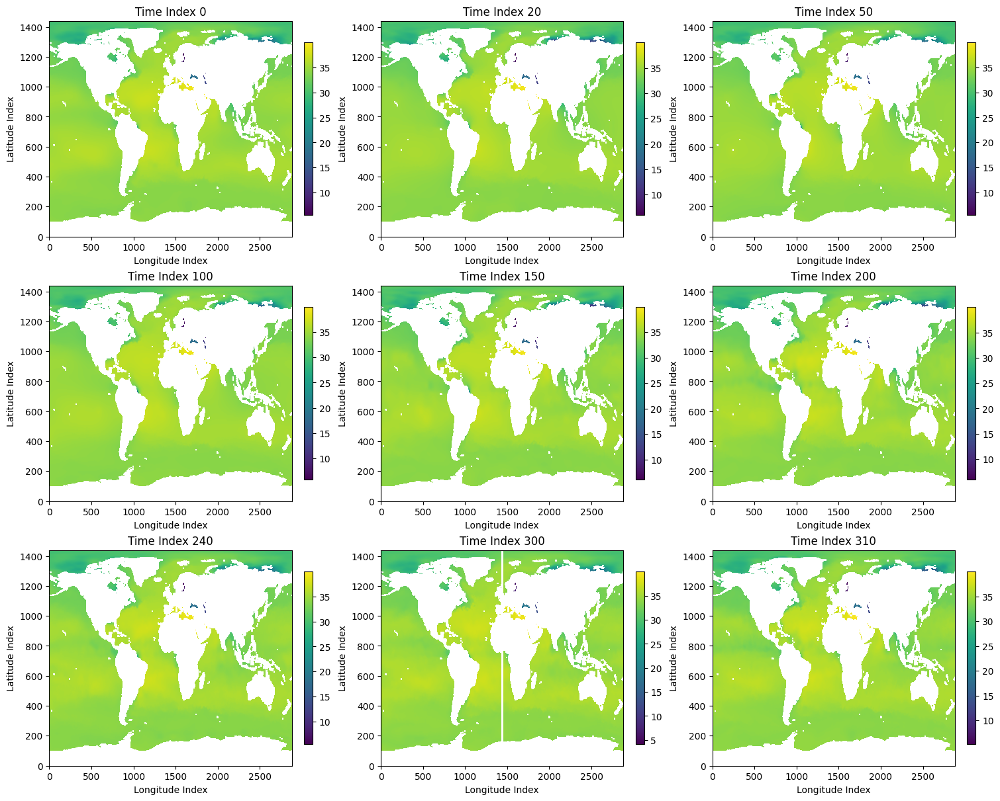

In [19]:
ds = xr.open_dataset(path)
print(ds)
plot_multiple_ocean_data(ds['sos'].values[:, 0, ...], [0, 20, 50, 100, 150, 200, 240, 300, 310])

In [20]:
# 删去depth维度
ds = ds.squeeze(dim='depth')
ds = ds.drop('depth')
# 重命名
ds = ds.rename({'longitude': 'lon', 'latitude': 'lat'})
ds = ds.rename({'sos': 'data'})

print(ds)

<xarray.Dataset>
Dimensions:  (time: 313, lat: 1440, lon: 2880)
Coordinates:
  * lat      (lat) float32 -89.94 -89.81 -89.69 -89.56 ... 89.69 89.81 89.94
  * lon      (lon) float32 -179.9 -179.8 -179.7 -179.6 ... 179.7 179.8 179.9
  * time     (time) datetime64[ns] 1993-01-01 1993-02-01 ... 2019-01-01
Data variables:
    data     (time, lat, lon) float32 nan nan nan nan nan ... nan nan nan nan
Attributes: (12/20)
    Conventions:               CF-1.7
    Scaling_Equation:          (scale_factor*data) + add_offset
    contact:                   servicedesk.cmems@mercator-ocean.eu
    creation_date:             Sat 12 Aug 2023 11:07:53
    date:                      Sat 07 Oct 2023 12:34:08 /store2/MOB/SSS_SSD_A...
    easternmost_longitude:     359.9375
    ...                        ...
    references:                Buongiorno Nardelli, B., R. Droghei, and R. Sa...
    software_version:          SSS/SSD HR Processor v1.0
    southernmost_latitude:     -89.9375
    title:              

<xarray.Dataset>
Dimensions:  (time: 313, lat: 360, lon: 720)
Coordinates:
  * time     (time) datetime64[ns] 1993-01-01 1993-02-01 ... 2019-01-01
  * lat      (lat) float64 -89.88 -89.37 -88.87 -88.37 ... 88.87 89.37 89.88
  * lon      (lon) float64 -179.9 -179.4 -178.9 -178.4 ... 178.9 179.4 179.9
Data variables:
    data     (time, lat, lon) float64 nan nan nan nan nan ... nan nan nan nan
Attributes: (12/20)
    Conventions:               CF-1.7
    Scaling_Equation:          (scale_factor*data) + add_offset
    contact:                   servicedesk.cmems@mercator-ocean.eu
    creation_date:             Sat 12 Aug 2023 11:07:53
    date:                      Sat 07 Oct 2023 12:34:08 /store2/MOB/SSS_SSD_A...
    easternmost_longitude:     359.9375
    ...                        ...
    references:                Buongiorno Nardelli, B., R. Droghei, and R. Sa...
    software_version:          SSS/SSD HR Processor v1.0
    southernmost_latitude:     -89.9375
    title:                

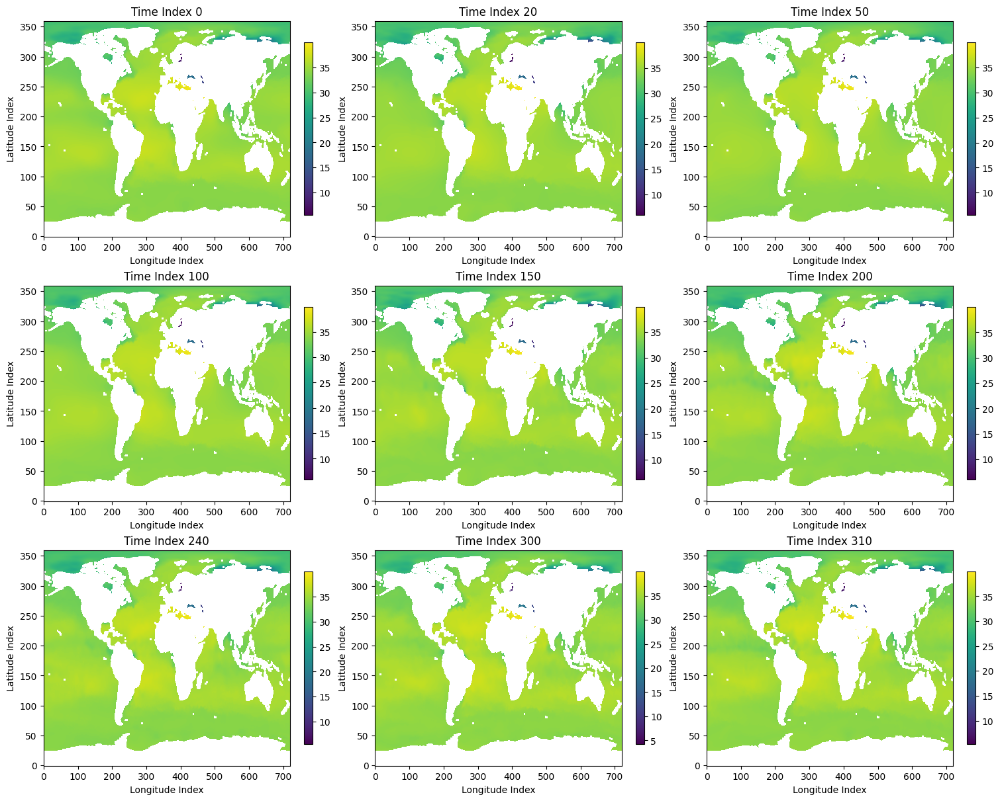

In [21]:
# 降采样
ds_resampled = down_sample(ds)
# 插值到sst
ds_interp = interp2refer(ds_resampled, sst_path)
print(ds_interp)
plot_multiple_ocean_data(ds_interp['data'].values, [0, 20, 50, 100, 150, 200, 240, 300, 310])


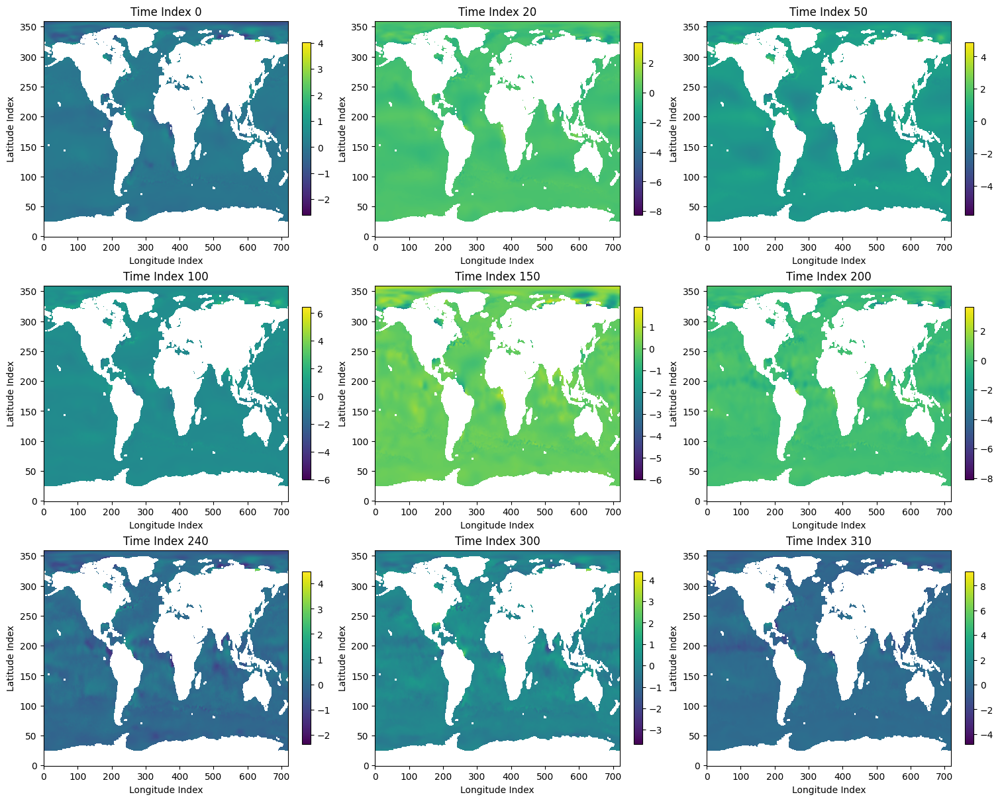

In [22]:
# 计算气候态
ds_anom = compute_anom(ds_interp)

plot_multiple_ocean_data(ds_anom['data'].values, [0, 20, 50, 100, 150, 200, 240, 300, 310])

ds_anom.to_netcdf(output_file)


# CORA

In [2]:
path_s = '/home/data2/pengguohang/My_Ocean/CMEMS/CORA_1993_2019_P1M/CORA_199301_201901_PSAL_P1M.nc'
path_t = '/home/data2/pengguohang/My_Ocean/CMEMS/CORA_1993_2019_P1M/CORA_199301_201901_TEMP_P1M.nc'

output_file_S = '/home/data2/pengguohang/My_Ocean/challenge/1993_2019_data/raw/CORA_S_15depth.nc'
output_file_T = '/home/data2/pengguohang/My_Ocean/challenge/1993_2019_data/raw/CORA_T_15depth.nc'

In [ ]:
# 查看数据
sds = xr.open_dataset(path_s)
tds = xr.open_dataset(path_t)
print(tds)
plot_multiple_ocean_data(tds['TEMP'].values[:, 0, ...], [0, 20, 50, 100, 150, 200, 240, 300, 310])

<xarray.Dataset>
Dimensions:    (depth: 102, latitude: 1671, longitude: 720, time: 313)
Coordinates:
  * depth      (depth) float32 1.0 3.0 5.0 10.0 15.0 ... 940.0 960.0 980.0 1e+03
  * latitude   (latitude) float64 -77.0 -76.9 -76.8 -76.7 ... 89.8 89.9 90.0
  * longitude  (longitude) float64 -180.0 -179.5 -179.0 ... 178.5 179.0 179.5
  * time       (time) datetime64[ns] 1993-01-01 1993-02-01 ... 2019-01-01
Data variables:
    TEMP       (time, depth, latitude, longitude) float32 ...
Attributes: (12/22)
    Conventions:               CF-1.4
    analysis_name:             OA_CORA5.2_
    comment:                   V8.0 reference climatology and analysis parame...
    creation_date:             20230926T220219L
    data_manager:              Tanguy Szekely
    easternmost_longitude:     179.5
    ...                        ...
    southernmost_latitude:     -77.0105
    start_date:                2022-12-15
    stop_date:                 2022-12-15
    title:                     Global O

In [25]:
# 重命名
sds_renamed = sds.rename({'longitude': 'lon', 'latitude': 'lat', 'PSAL': 'data'})
tds_renamed = tds.rename({'longitude': 'lon', 'latitude': 'lat', 'TEMP': 'data'})

# 截取需要的深度
my_depth_indices = [0, 3, 7, 15, 21, 26, 31, 41, 51, 61, 71, 81, 91, 96, 101]

s_subset = sds_renamed.isel(depth=my_depth_indices)
t_subset = tds_renamed.isel(depth=my_depth_indices)


# 扩充lat维度到-90
def pad_lat(ds):
    original_lat = ds.lat.values
    new_lat_lower = np.linspace(-90, original_lat.min(), num=130)
    # 合并原有纬度与新增纬度
    new_lat = np.concatenate([new_lat_lower[:-1], original_lat])
    # 创建新的数据集，扩展纬度并填充NaN
    sds_expanded = ds.reindex(lat=new_lat, method=None)  # 新增纬度点会被填充为NaN

    return sds_expanded

sds_expanded = pad_lat(s_subset)
tds_expanded = pad_lat(t_subset)

# 检查结果
print(sds_expanded)

<xarray.Dataset>
Dimensions:  (depth: 15, lat: 1800, lon: 720, time: 313)
Coordinates:
  * depth    (depth) float32 1.0 10.0 30.0 70.0 ... 700.0 800.0 900.0 1e+03
  * lat      (lat) float64 -90.0 -89.9 -89.8 -89.7 -89.6 ... 89.7 89.8 89.9 90.0
  * lon      (lon) float64 -180.0 -179.5 -179.0 -178.5 ... 178.5 179.0 179.5
  * time     (time) datetime64[ns] 1993-01-01 1993-02-01 ... 2019-01-01
Data variables:
    data     (time, depth, lat, lon) float32 nan nan nan nan ... nan nan nan nan
Attributes: (12/22)
    Conventions:               CF-1.4
    analysis_name:             OA_CORA5.2_
    comment:                   V8.0 reference climatology and analysis parame...
    creation_date:             20230926T220219L
    data_manager:              Tanguy Szekely
    easternmost_longitude:     179.5
    ...                        ...
    southernmost_latitude:     -77.0105
    start_date:                2022-12-15
    stop_date:                 2022-12-15
    title:                     Global 

<xarray.Dataset>
Dimensions:  (depth: 15, time: 313, lat: 360, lon: 720)
Coordinates:
  * depth    (depth) float32 1.0 10.0 30.0 70.0 ... 700.0 800.0 900.0 1e+03
  * time     (time) datetime64[ns] 1993-01-01 1993-02-01 ... 2019-01-01
  * lat      (lat) float64 -90.0 -89.5 -89.0 -88.5 ... 88.5 89.0 89.5 90.0
  * lon      (lon) float64 -180.0 -179.5 -179.0 -178.5 ... 178.5 179.0 179.5
Data variables:
    data     (time, depth, lat, lon) float64 nan nan nan nan ... nan nan nan nan
Attributes: (12/22)
    Conventions:               CF-1.4
    analysis_name:             OA_CORA5.2_
    comment:                   V8.0 reference climatology and analysis parame...
    creation_date:             20230926T220219L
    data_manager:              Tanguy Szekely
    easternmost_longitude:     179.5
    ...                        ...
    southernmost_latitude:     -77.0105
    start_date:                2022-12-15
    stop_date:                 2022-12-15
    title:                     Global Ocean -

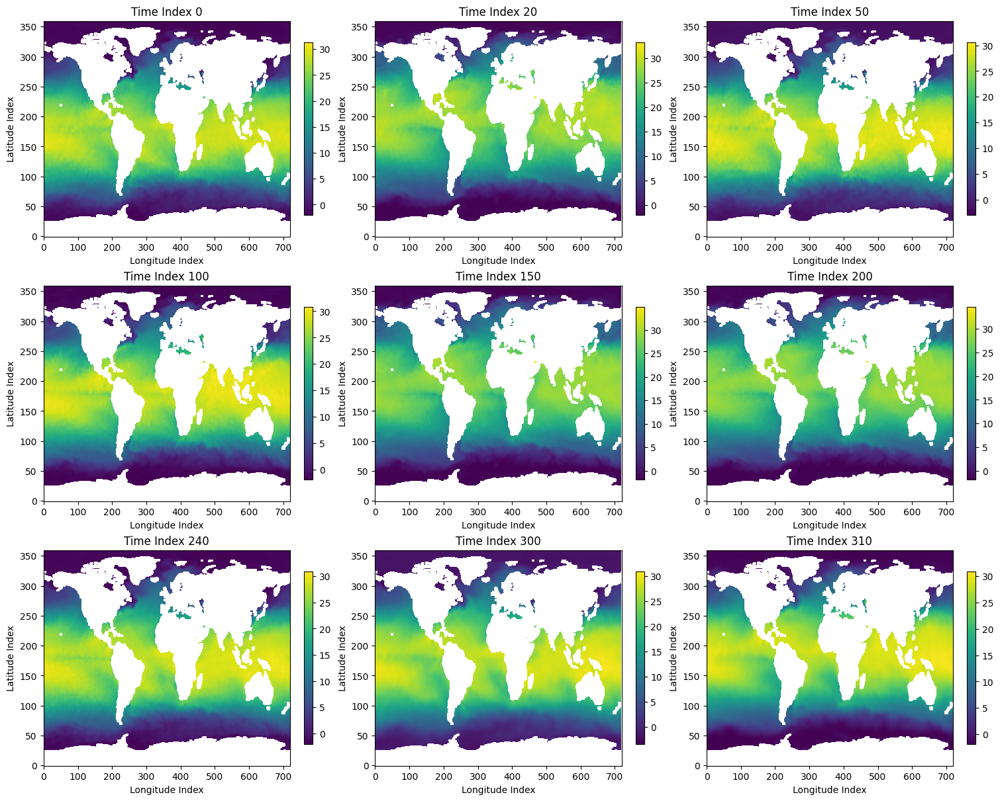

In [26]:
# 降采样
s_resampled = down_sample(sds_expanded)
t_resampled = down_sample(tds_expanded)

print(t_resampled)

# 插值到SST网格上
s_interp = interp2refer(s_resampled, sst_path)
t_interp = interp2refer(t_resampled, sst_path)

print(t_interp)
plot_multiple_ocean_data(t_interp['data'].values[:, 0, ...], [0, 20, 50, 100, 150, 200, 240, 300, 310])

<xarray.Dataset>
Dimensions:  (depth: 15, time: 313, lat: 360, lon: 720)
Coordinates:
  * depth    (depth) float32 1.0 10.0 30.0 70.0 ... 700.0 800.0 900.0 1e+03
  * time     (time) datetime64[ns] 1993-01-01 1993-02-01 ... 2019-01-01
  * lat      (lat) float64 -89.88 -89.37 -88.87 -88.37 ... 88.87 89.37 89.88
  * lon      (lon) float64 -179.9 -179.4 -178.9 -178.4 ... 178.9 179.4 179.9
Data variables:
    data     (time, depth, lat, lon) float64 nan nan nan nan ... nan nan nan nan


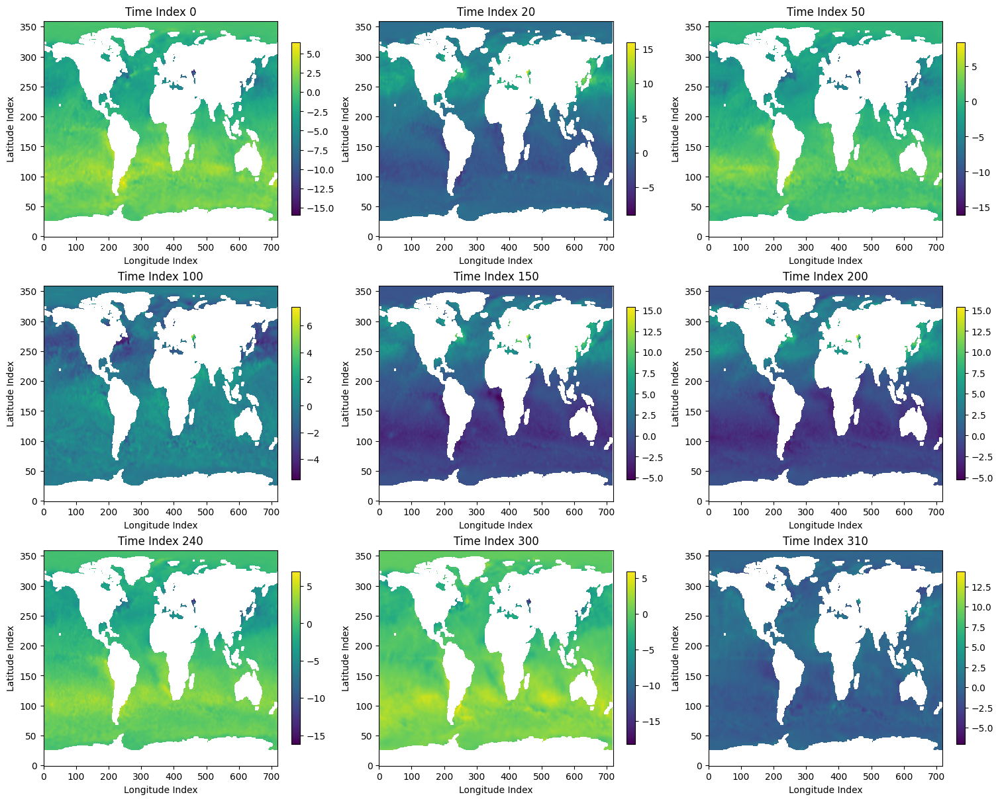

In [27]:
s_anom = compute_anom(s_interp)
t_anom = compute_anom(t_interp)

print(t_anom)
plot_multiple_ocean_data(t_anom['data'].values[:, 0, ...], [0, 20, 50, 100, 150, 200, 240, 300, 310])

s_anom.to_netcdf(output_file_S)
t_anom.to_netcdf(output_file_T)

# dataset

In [2]:
# 将所有的文件合并在var维度并保存
def get_input_data(folder_path):
    """
    提取输入数据并拼接
    folder_path: 数据文件夹地址
    
    return:  (var, time, lat, lon)
    """
    # 1、提取文件名
    nc_files = [file for file in os.listdir(folder_path) if file.endswith('.nc')]
    # 存储数据
    data_all = []
    # 2、逐个加载.nc文件
    for file in nc_files:
        file_path = os.path.join(folder_path, file)
        print(f"Processing file: {file_path}")
        ds = xr.open_dataset(file_path)
        data_all.append(ds)

    # 将所有插值后的数据堆叠在一起
    data_all = xr.concat(data_all, dim='var').transpose("var", 'time', 'lat', 'lon')

    # print('shape of region:', data_all.shape)
    return data_all

path = '/home/data2/pengguohang/My_Ocean/challenge/1993_2019_data/raw/'
data = get_input_data(path)

# 删除所有的属性
data.attrs = {}
print(data)

output_file = "/home/data2/pengguohang/My_Ocean/challenge/1993_2019_data/input.nc"
data.to_netcdf(output_file)

Processing file: /home/data2/pengguohang/My_Ocean/challenge/1993_2019_data/raw/mdt_cnes_cls18_global_down.nc
Processing file: /home/data2/pengguohang/My_Ocean/challenge/1993_2019_data/raw/oisst_199301_201901_monthly.nc
Processing file: /home/data2/pengguohang/My_Ocean/challenge/1993_2019_data/raw/v_199301_201901_monthly.nc
Processing file: /home/data2/pengguohang/My_Ocean/challenge/1993_2019_data/raw/sla_199301_201901_monthly.nc
Processing file: /home/data2/pengguohang/My_Ocean/challenge/1993_2019_data/raw/u_199301_201901_monthly.nc
Processing file: /home/data2/pengguohang/My_Ocean/challenge/1993_2019_data/raw/sss_l4_199301_201901_monthly_down.nc
<xarray.Dataset>
Dimensions:  (time: 313, var: 6, lat: 360, lon: 720)
Coordinates:
  * time     (time) datetime64[ns] 1993-01-01 1993-02-01 ... 2019-01-01
  * lat      (lat) float64 -89.88 -89.37 -88.87 -88.37 ... 88.87 89.37 89.88
  * lon      (lon) float64 -179.9 -179.4 -178.9 -178.4 ... 178.9 179.4 179.9
Dimensions without coordinates: var


# 检查dataset

In [2]:
input_path = '/home/data2/pengguohang/My_Ocean/challenge/1993_2019_data/input.nc'
label_T_path = '/home/data2/pengguohang/My_Ocean/challenge/1993_2019_data/CORA_T_15depth.nc'

input_ds = xr.open_dataset(input_path)
label_T_ds = xr.open_dataset(label_T_path)

print(input_ds)
print(label_T_ds)

<xarray.Dataset>
Dimensions:  (time: 313, var: 6, lat: 360, lon: 720)
Coordinates:
  * time     (time) datetime64[ns] 1993-01-01 1993-02-01 ... 2019-01-01
  * lat      (lat) float64 -89.88 -89.37 -88.87 -88.37 ... 88.87 89.37 89.88
  * lon      (lon) float64 -179.9 -179.4 -178.9 -178.4 ... 178.9 179.4 179.9
Dimensions without coordinates: var
Data variables:
    data     (var, time, lat, lon) float64 ...
<xarray.Dataset>
Dimensions:  (depth: 15, time: 313, lat: 360, lon: 720)
Coordinates:
  * depth    (depth) float32 1.0 10.0 30.0 70.0 ... 700.0 800.0 900.0 1e+03
  * time     (time) datetime64[ns] 1993-01-01 1993-02-01 ... 2019-01-01
  * lat      (lat) float64 -89.88 -89.37 -88.87 -88.37 ... 88.87 89.37 89.88
  * lon      (lon) float64 -179.9 -179.4 -178.9 -178.4 ... 178.9 179.4 179.9
Data variables:
    data     (time, depth, lat, lon) float64 ...


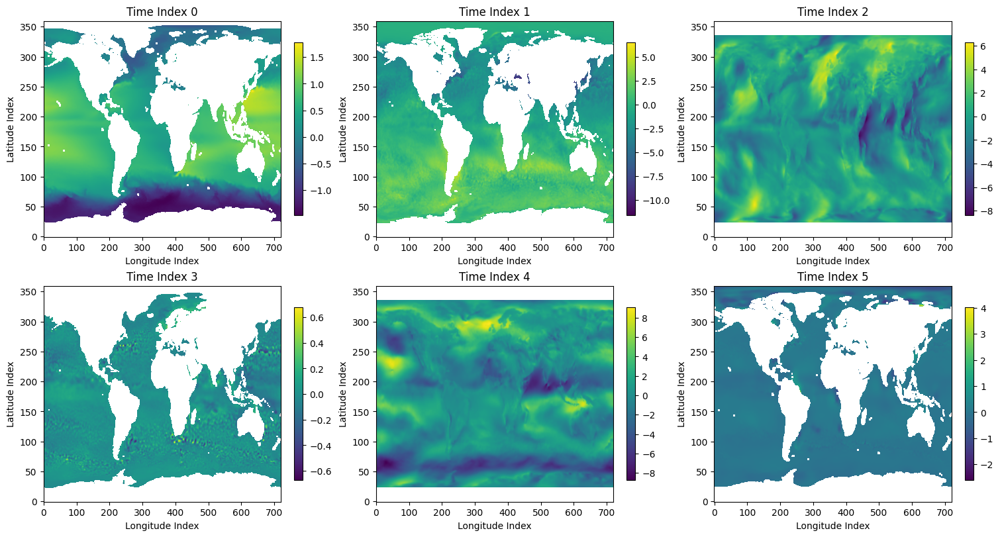

In [5]:
input = input_ds['data'].values

plot_multiple_ocean_data(input[:, 0, ...], [0, 1, 2, 3, 4, 5])

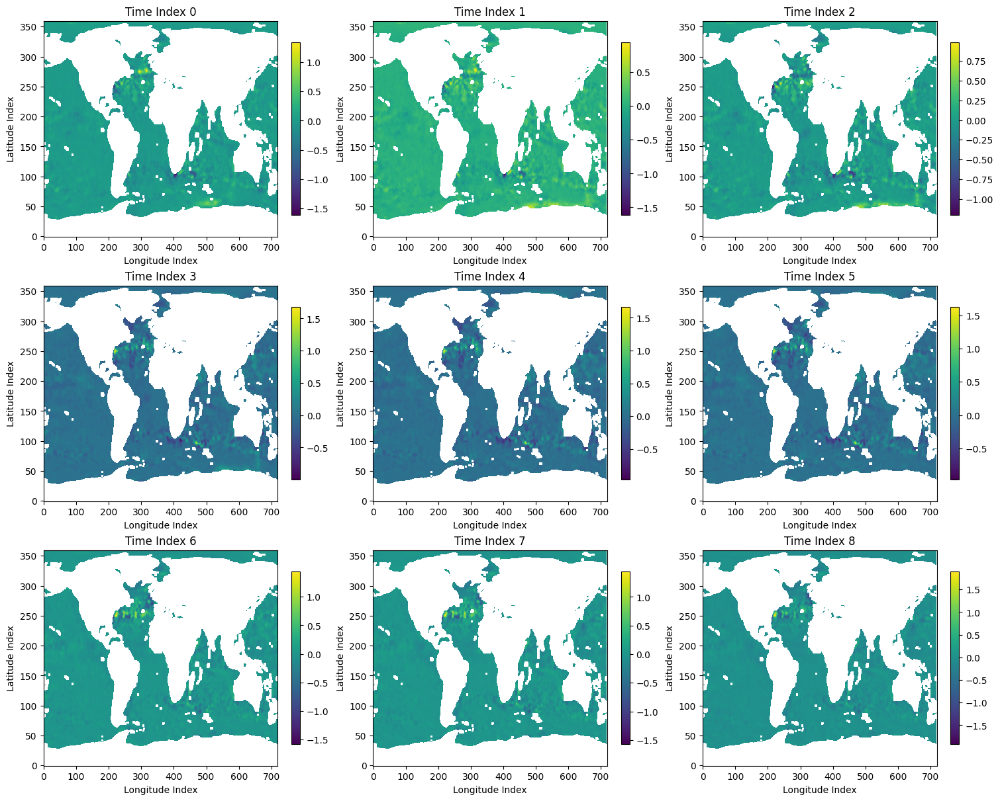

In [6]:
label_T = label_T_ds['data'].values

plot_multiple_ocean_data(label_T[:, -1, ...], [0, 1, 2, 3, 4, 5, 6, 7, 8])

<xarray.Dataset>
Dimensions:  (depth: 15, time: 313, lat: 360, lon: 720)
Coordinates:
  * depth    (depth) float32 1.0 10.0 30.0 70.0 ... 700.0 800.0 900.0 1e+03
  * time     (time) datetime64[ns] 1993-01-01 1993-02-01 ... 2019-01-01
  * lat      (lat) float64 -89.88 -89.37 -88.87 -88.37 ... 88.87 89.37 89.88
  * lon      (lon) float64 -179.9 -179.4 -178.9 -178.4 ... 178.9 179.4 179.9
Data variables:
    data     (time, depth, lat, lon) float64 nan nan nan nan ... nan nan nan nan


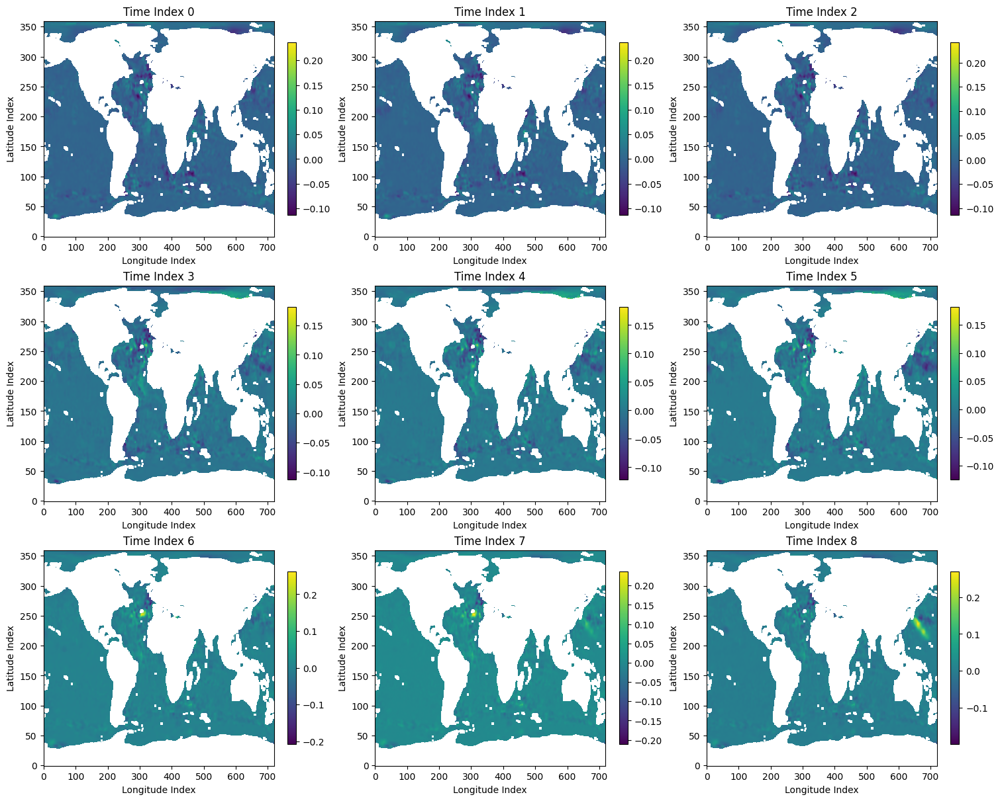

In [7]:
label_S_path = '/home/data2/pengguohang/My_Ocean/challenge/1993_2019_data/CORA_S_15depth.nc'
label_S_ds = xr.open_dataset(label_S_path)
label_S = label_S_ds['data'].values

print(label_S_ds)
plot_multiple_ocean_data(label_S[:, -1, ...], [0, 1, 2, 3, 4, 5, 6, 7, 8])

# get data

归一化与逆归一化

In [25]:
# minmax normolization
def get_data(folder_path, task):
    """
    Extract input data and normalization
        folder_path: data folder path
        task: task from {S, T}

    return: (var, time, lat, lon)
    """

    if task == 'S':
        label_file = 'CORA_S_15depth.nc'
    elif task == 'T':
        label_file = 'CORA_T_15depth.nc'

    input_path = os.path.join(folder_path, 'input.nc')
    label_path = os.path.join(folder_path, label_file)
    input = xr.open_dataset(input_path)
    label = xr.open_dataset(label_path)
    
    # 1. input normalization
    input_data = torch.tensor(input['data'].values)  # [var, time, lat, lon]
    
    masked_input = input_data.clone()
    masked_input[torch.isnan(input_data)] = -float('inf')  
    max_input, _ = torch.max(masked_input.view(masked_input.shape[0], -1), dim=1)
    masked_input[torch.isnan(input_data)] = float('inf')  
    min_input, _ = torch.min(masked_input.view(masked_input.shape[0], -1), dim=1)
    max_input[0], min_input[0] = 1, 0  # 第一个为mdt数据，不归一化
    print(min_input, max_input)

    max_input, min_input = max_input.view(max_input.shape[0], 1, 1, 1).expand_as(input_data), min_input.view(max_input.shape[0], 1, 1, 1).expand_as(input_data)
    input_minmax = (input_data - min_input) / (max_input - min_input)  # minmax normalization

    # 2. label normalization
    label_data = torch.tensor(label['data'].values).permute(1, 0, 2, 3)  # ->[depth, time, lat, lon]
    print(label_data.shape)

    masked_label = label_data.clone()
    masked_label[torch.isnan(label_data)] = -float('inf')
    max_label, _ = torch.max(masked_label.reshape(masked_label.shape[0], -1), dim=1)
    masked_label[torch.isnan(label_data)] = float('inf')
    min_label, _ = torch.min(masked_label.reshape(masked_label.shape[0], -1), dim=1)
    print(min_label, max_label)

    max_label, min_label = max_label.view(label_data.shape[0], 1, 1, 1).expand_as(label_data), min_label.view(label_data.shape[0], 1, 1, 1).expand_as(label_data)
    label_minmax = (label_data - min_label) / (max_label - min_label)  # minmax normalization

    minmax = [min_input, max_input, min_label, max_label]


    return input_minmax, label_minmax, label['depth'].values, minmax


folder_path = '/home/data2/pengguohang/My_Ocean/challenge/1993_2019_data'
task = 'T'

x, y, depth, minmax = get_data(folder_path, task)


tensor([  0.0000, -18.2292, -11.5888,  -1.2143, -11.6891,  -8.4807],
       dtype=torch.float64) tensor([ 1.0000, 16.4871, 12.4214,  1.1627, 12.5257,  9.5259],
       dtype=torch.float64)
torch.Size([15, 313, 360, 720])
tensor([-18.2203, -19.2066, -31.6939, -18.0543, -17.2726, -11.2463, -10.5562,
        -10.2711, -11.2142, -10.1862,  -7.6146,  -6.9963,  -6.4367,  -6.9673,
         -7.5580], dtype=torch.float64) tensor([24.2764, 24.9757, 24.9349, 24.0823, 24.2821, 24.8928, 23.2925, 24.0029,
        17.3036, 12.2588, 12.6501, 10.4037,  9.0215, 10.6013,  6.4167],
       dtype=torch.float64)


torch.Size([6, 313, 360, 720]) torch.Size([15, 313, 360, 720])
torch.Size([6, 313, 360, 720]) torch.Size([6, 313, 360, 720]) torch.Size([15, 313, 360, 720]) torch.Size([15, 313, 360, 720])


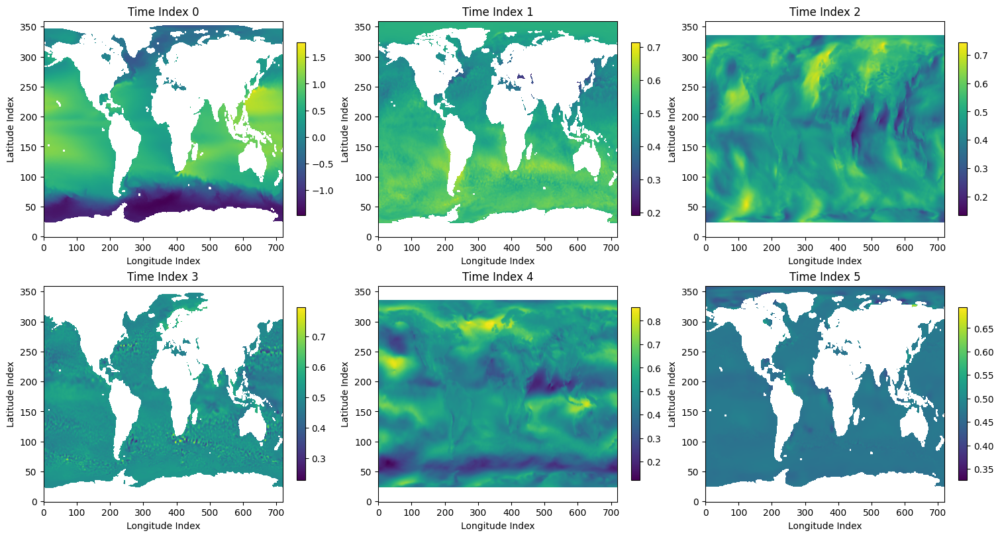

In [26]:
min_input, max_input, min_label, max_label = minmax
print(x.shape, y.shape, )
print(min_input.shape, max_input.shape, min_label.shape, max_label.shape)

plot_multiple_ocean_data(x[:, 0, ...], [0, 1, 2, 3, 4, 5])

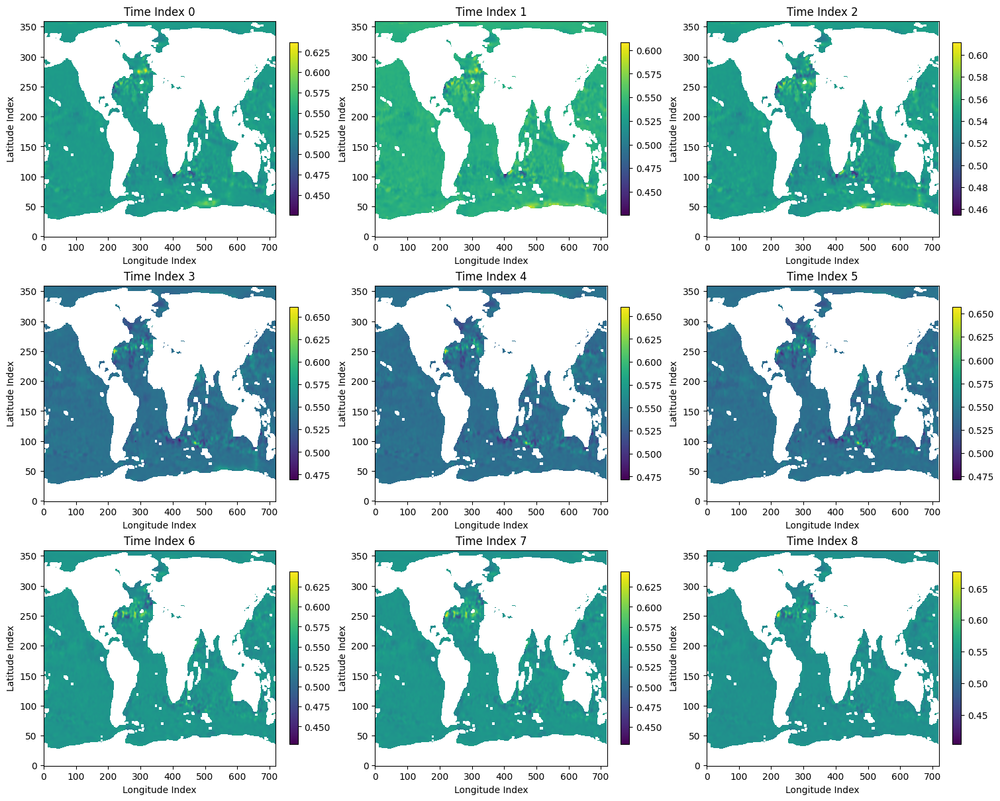

In [27]:
plot_multiple_ocean_data(y[-1, :, ...], [0, 1, 2, 3, 4, 5, 6, 7, 8])

torch.Size([6, 313, 360, 720]) torch.Size([15, 313, 360, 720])


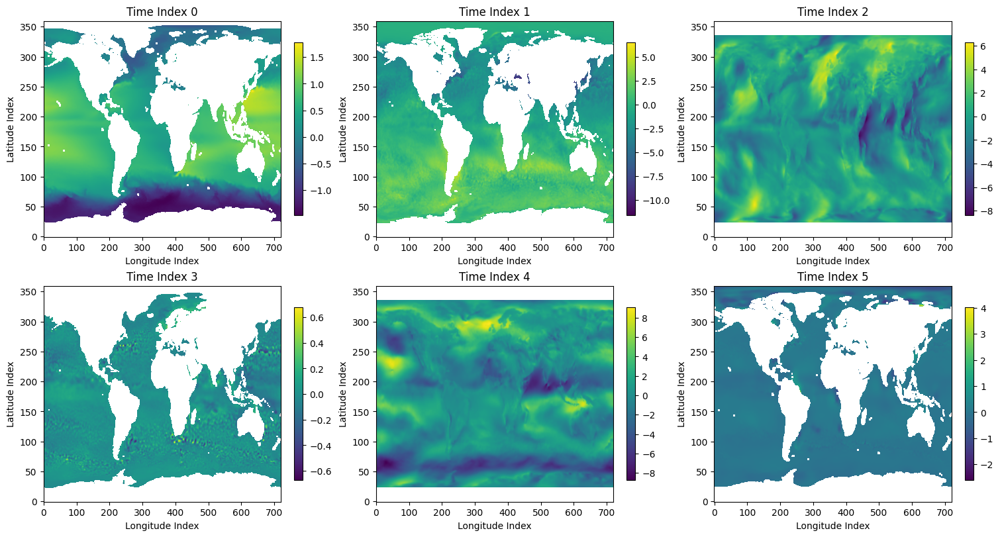

In [28]:
# 逆归一化
x = x*(max_input-min_input)+min_input
y = y*(max_label-min_label)+min_label
print(x.shape, y.shape)

plot_multiple_ocean_data(x[:, 0, ...], [0, 1, 2, 3, 4, 5])

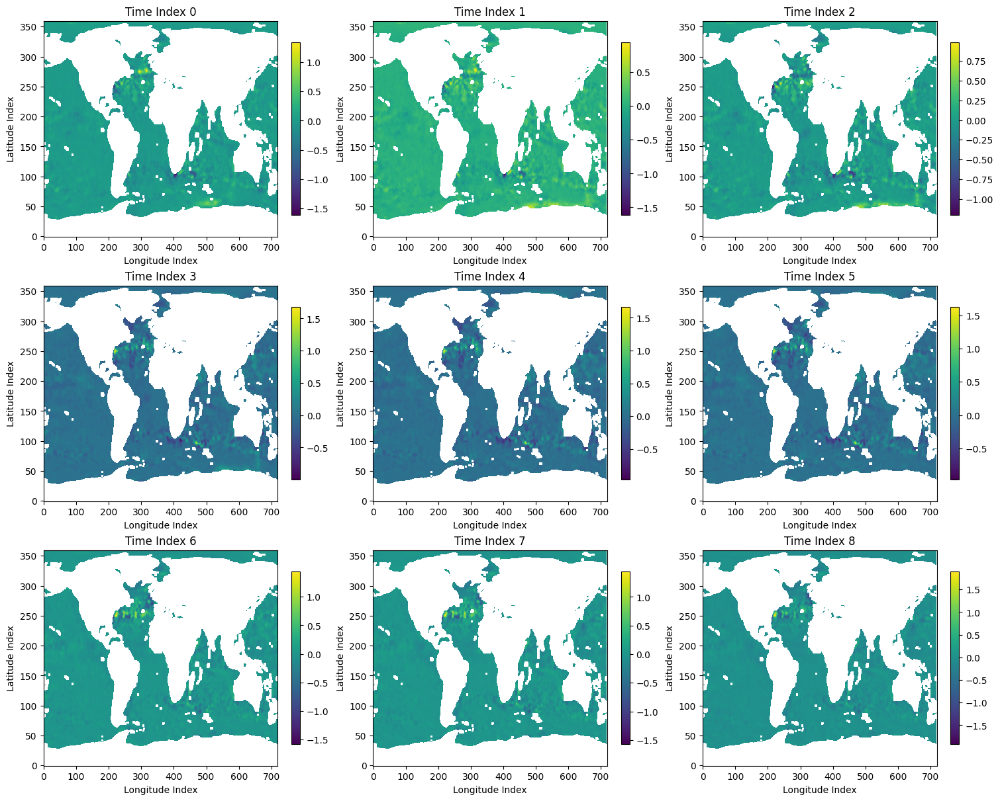

In [29]:
plot_multiple_ocean_data(y[-1, :, ...], [0, 1, 2, 3, 4, 5, 6, 7, 8])

# STDataset

In [52]:
class STDataset(Dataset):
    def __init__(self,
                 region_name = 'Gulf',
                 folder_path='/home/data2/pengguohang/My_Ocean/challenge/1993_2019_data/',
                 task='S',  # S T Chl 
                 if_train=True,
                 seq_len=0,
                 ):

        if region_name == 'Gulf':
            self.lat_min, self.lat_max = 23, 50
            self.lon_min, self.lon_max = -80, -30
        elif region_name == 'Pacific':
            self.lat_min, self.lat_max = -50, 0  
            self.lon_min, self.lon_max = -150, -70   
        elif region_name == 'Indian':
            self.lat_min, self.lat_max = -20, 10  
            self.lon_min, self.lon_max = 40, 100  

        else: 
            print('Invilid regian name!!!')

        self.input, self.label, self.lat, self.lon, self.depth, self.minmax = self.get_data(folder_path, task)
        self.input = self.input.permute(1, 0, 2, 3)  # [time, var, lat, lon]
        self.label = self.label.permute(1, 0, 2, 3)  # [time, depth, lat, lon]
        self.lat = torch.tensor(self.lat)
        self.lon = torch.tensor(self.lon)
        self.depth = torch.tensor(self.depth)
        # print('depth: ', self.depth)

        # 将lat和lon合并到input中
        time = self.input.shape[0]
        lat = self.input.shape[2]
        lon = self.input.shape[3]
        expand_lat = ( (self.lat-self.lat.min()) / (self.lat.max() - self.lat.min())).unsqueeze(0).unsqueeze(-1).repeat(time, 1, 1, lon)
        expand_lon = ( (self.lon-self.lon.min()) / (self.lon.max() - self.lon.min())).unsqueeze(0).unsqueeze(0).repeat(time, 1, lat, 1)
        self.input = torch.cat((self.input, expand_lat, expand_lon), dim=1)
        # print('add lat: ', self.input.shape, expand_lat.shape)

        # 将时间合并到input中
        time_series = np.array(range(time))
        jd1 = torch.cos( torch.tensor(2*np.pi*(time_series/12)+1) )
        jd2 = torch.sin( torch.tensor(2*np.pi*(time_series/12)+1) )
        jd1 = jd1.unsqueeze(-1).unsqueeze(-1).unsqueeze(-1).repeat(1, 1, lat, lon)
        jd2 = jd2.unsqueeze(-1).unsqueeze(-1).unsqueeze(-1).repeat(1, 1, lat, lon)
        # print('add time: ', self.input.shape, jd1.shape)
        # print('jd1, jd2', jd1.shape, jd2.shape)
        self.input = torch.cat((self.input, jd1), dim=1)
        self.input = torch.cat((self.input, jd2), dim=1)

        # Create mask: if any input variable or label at a grid point is NaN, set mask to False
        input_nan_mask = torch.isnan(self.input)
        label_nan_mask = torch.isnan(self.label)
        input_nan_mask = input_nan_mask.any(dim=(0, 1))  # [time, var, lat, lon]
        label_nan_mask = label_nan_mask.any(dim=(0, 1))
        self.mask = (~label_nan_mask) & (~input_nan_mask)  # [lat, lon], NaN

        # Time-series data: Add seq_len dimension, create sliding window sequences
        if seq_len > 0:
            num = self.input.shape[0] - seq_len
            self.input = torch.stack([self.input[i:i + seq_len] for i in range(num)], dim=0)
            self.label = torch.stack([self.label[i + seq_len - 1:i + seq_len] for i in range(num)], dim=0)

        # Split data into train: 199401-201712, test: 199301-199312, 201801-201901
        test_len = 12
        train_len = self.input.shape[0] - test_len
        if if_train:
            self.input = self.input[test_len + 1:train_len, ...]
            self.label = self.label[test_len + 1:train_len, ...]
        else:
            input1 = self.input[:test_len + 1, ...]  # First 12 months
            label1 = self.label[:test_len + 1, ...]
            input2 = self.input[train_len:, ...]  # Last 12 months
            label2 = self.label[train_len:, ...]
            self.input = torch.cat((input1, input2), dim=0)
            self.label = torch.cat((label1, label2), dim=0)

        print('Shape of variables:', self.input.shape, self.label.shape, self.lat.shape, self.lon.shape, self.depth.shape)

    def get_data(self, folder_path, task):
        """
        Extract input data and normalization
         folder_path: data folder path
         task: task from {S, T}

        return: 
         input_sub: [var, time, lat, lon]
         label_sub: [depth, time, lat, lon]
         lat_sub, lon_sub, depth
         minmax: [min_input, max_input, min_label, max_label]
    
        """

        if task == 'S':
            label_file = 'CORA_S_15depth.nc'
        elif task == 'T':
            label_file = 'CORA_T_15depth.nc'

        input_path = os.path.join(folder_path, 'input.nc')
        label_path = os.path.join(folder_path, label_file)
        input = xr.open_dataset(input_path)
        label = xr.open_dataset(label_path)
        
        # 1. input normalization
        input_data = torch.tensor(input['data'].values)  # [var, time, lat, lon]
        
        masked_input = input_data.clone()
        masked_input[torch.isnan(input_data)] = -float('inf')  
        max_input_1, _ = torch.max(masked_input.view(masked_input.shape[0], -1), dim=1)
        masked_input[torch.isnan(input_data)] = float('inf')  
        min_input_1, _ = torch.min(masked_input.view(masked_input.shape[0], -1), dim=1)
        max_input_1[0], min_input_1[0] = 1, 0  # 第一个为mdt数据，不归一化

        max_input = max_input_1.view(max_input_1.shape[0], 1, 1, 1).expand_as(input_data)
        min_input = min_input_1.view(min_input_1.shape[0], 1, 1, 1).expand_as(input_data)

        input_minmax = (input_data - min_input) / (max_input - min_input)  # minmax normalization
 
        # 2. label normalization
        label_data = torch.tensor(label['data'].values).permute(1, 0, 2, 3)  # ->[depth, time, lat, lon]

        masked_label = label_data.clone()
        masked_label[torch.isnan(label_data)] = -float('inf')
        max_label_1, _ = torch.max(masked_label.reshape(masked_label.shape[0], -1), dim=1)
        masked_label[torch.isnan(label_data)] = float('inf')
        min_label_1, _ = torch.min(masked_label.reshape(masked_label.shape[0], -1), dim=1)

        max_label = max_label_1.view(label_data.shape[0], 1, 1, 1).expand_as(label_data)
        min_label = min_label_1.view(label_data.shape[0], 1, 1, 1).expand_as(label_data)
        label_minmax = (label_data - min_label) / (max_label - min_label)  # minmax normalization

        minmax = [min_input_1, max_input_1, min_label_1, max_label_1]

        # 3. get sub
        input_sub, lat_sub, lon_sub = self.get_sub(input_minmax, input['lat'].values, input['lon'].values)
        label_sub, _, _ = self.get_sub(label_minmax, input['lat'].values, input['lon'].values)

        return input_sub, label_sub, lat_sub, lon_sub, label['depth'].values, minmax
    
    def get_sub(self, data, latitude, longitude):
        """
        提取子区域的数据
         lat_min, lat_max, lon_min, lon_max: 子区域范围
         data: 原始数据
         latitude, longitude: 经纬度数据

        return: 
         subset_data
         subset_lat, subset_lon
        """
        # print('in sub: ', data.shape, latitude.shape, longitude.shape)
        lat_indices = np.where((latitude >= self.lat_min) & (latitude <= self.lat_max))[0]
        lon_indices = np.where((longitude >= self.lon_min) & (longitude <= self.lon_max))[0]

        subset_data = data[:, :, lat_indices, :][:, :, :, lon_indices]
        # print(subset_data.shape)

        subset_lat = latitude[lat_indices]
        subset_lon = longitude[lon_indices]

        return subset_data, subset_lat, subset_lon
    
    def get_depth(self):
        return self.depth
    
    def get_position(self):
        return self.lat, self.lon

    def get_Minmax(self):
        min_input, max_input, min_label, max_label = self.minmax
        return min_label, max_label

    def __len__(self):
        return len(self.input)

    def __getitem__(self, idx):
        inputs = self.input[idx]   # (var, lat, lon) or (seq, var, lat, lon)
        label = self.label[idx]    # (dept, lat, lon) or (seq, dept, lat, lon)
        mask = self.mask  # (lat, lon)
        
        return inputs.float(), label.float(), mask


In [53]:
from torch.utils.data import DataLoader

dataset = STDataset(task='S')
dataloader = DataLoader(dataset, batch_size=2)

Shape of variables: torch.Size([288, 10, 54, 100]) torch.Size([288, 15, 54, 100]) torch.Size([54]) torch.Size([100]) torch.Size([15])


In [54]:
depth = dataset.get_depth()
print(depth)

tensor([   1.,   10.,   30.,   70.,  100.,  150.,  200.,  300.,  400.,  500.,
         600.,  700.,  800.,  900., 1000.])


In [55]:
lat, lon = dataset.get_position()
print(lat, lon)

tensor([23.2824, 23.7831, 24.2838, 24.7845, 25.2852, 25.7859, 26.2866, 26.7873,
        27.2880, 27.7886, 28.2893, 28.7900, 29.2907, 29.7914, 30.2921, 30.7928,
        31.2935, 31.7942, 32.2949, 32.7956, 33.2963, 33.7970, 34.2977, 34.7984,
        35.2991, 35.7998, 36.3005, 36.8012, 37.3019, 37.8026, 38.3033, 38.8040,
        39.3047, 39.8054, 40.3061, 40.8068, 41.3075, 41.8081, 42.3088, 42.8095,
        43.3102, 43.8109, 44.3116, 44.8123, 45.3130, 45.8137, 46.3144, 46.8151,
        47.3158, 47.8165, 48.3172, 48.8179, 49.3186, 49.8193],
       dtype=torch.float64) tensor([-79.8055, -79.3051, -78.8048, -78.3044, -77.8041, -77.3037, -76.8034,
        -76.3030, -75.8027, -75.3023, -74.8020, -74.3016, -73.8013, -73.3009,
        -72.8006, -72.3002, -71.7999, -71.2995, -70.7992, -70.2989, -69.7985,
        -69.2982, -68.7978, -68.2975, -67.7971, -67.2968, -66.7964, -66.2961,
        -65.7957, -65.2954, -64.7950, -64.2947, -63.7943, -63.2940, -62.7936,
        -62.2933, -61.7929, -61.2926, -

In [59]:
min_label, max_label = dataset.get_Minmax()
print(min_label, max_label)

tensor([-22.3365, -10.7569,  -6.6964,  -4.4988,  -5.1653,  -5.1971,  -5.2404,
         -5.3556,  -5.4858,  -5.6206,  -5.7480,  -5.6085,  -0.9481,  -0.7738,
         -0.7684], dtype=torch.float64) tensor([12.5375,  5.3539,  2.7673,  2.0444,  1.4409,  1.3003,  1.1856,  1.1887,
         1.4225,  1.4487,  1.4819,  1.4546,  1.4365,  1.3752,  1.2781],
       dtype=torch.float64)


In [40]:
x, y, mask = next(iter(dataloader))
print(x.shape, y.shape, mask.shape)

torch.Size([2, 10, 54, 100]) torch.Size([2, 15, 54, 100]) torch.Size([2, 54, 100])


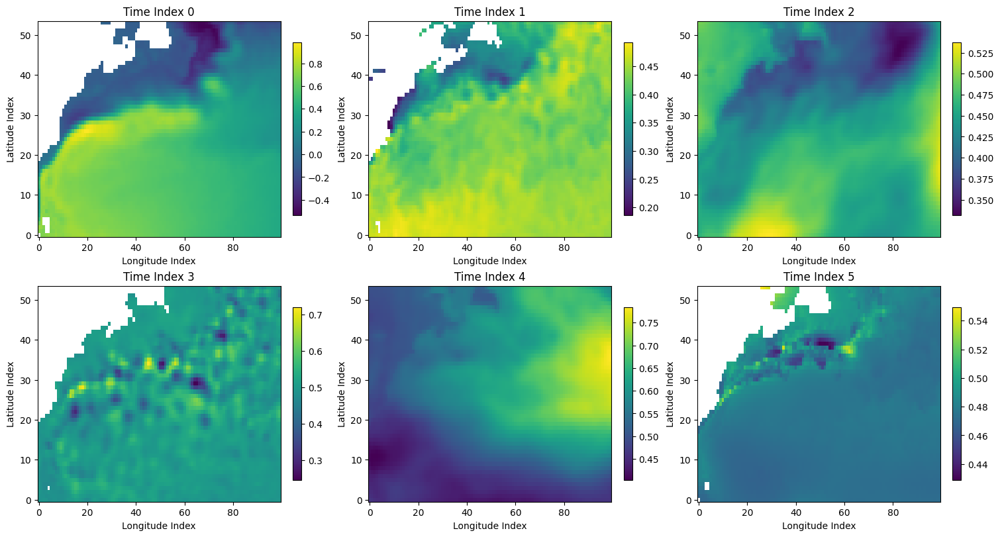

In [42]:
plot_multiple_ocean_data(x[0], [0, 1, 2, 3, 4, 5])

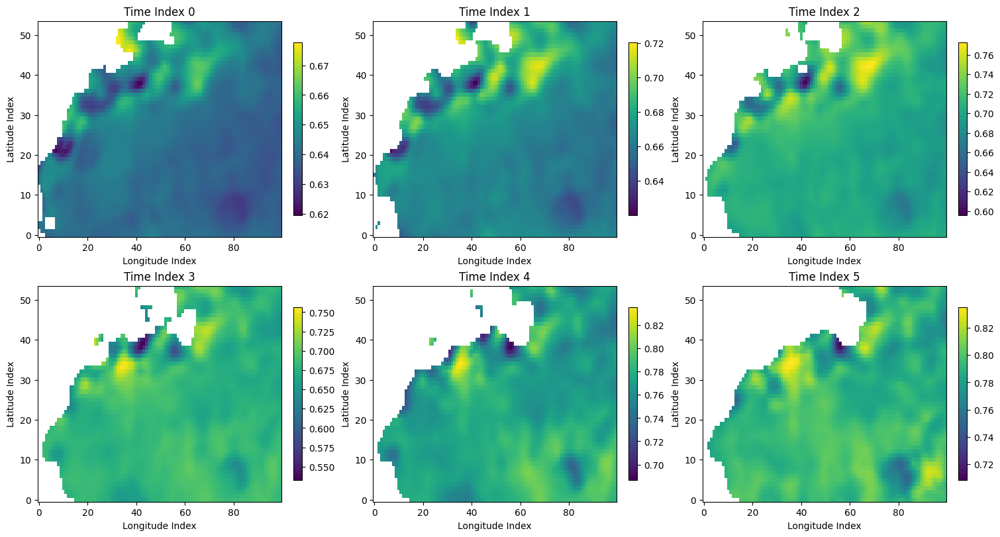

In [43]:
plot_multiple_ocean_data(y[0], [0, 1, 2, 3, 4, 5])

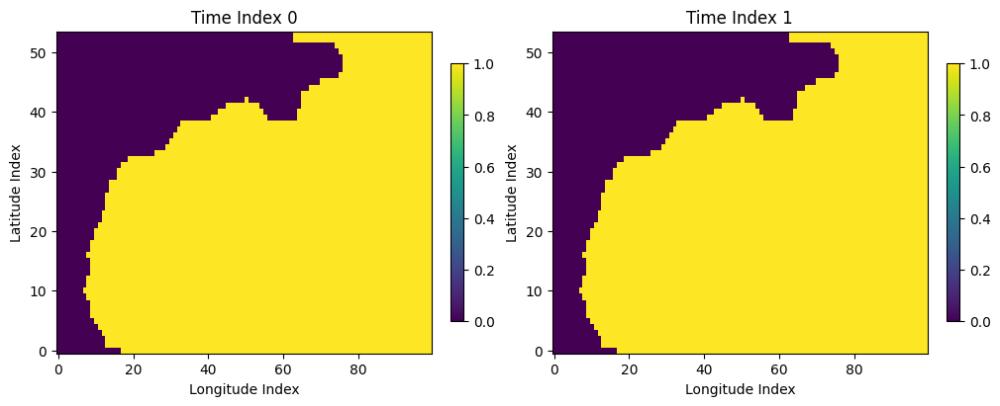

In [44]:
plot_multiple_ocean_data(mask, [0, 1])